In [1]:
# importing liabraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
# loading data
df = pd.read_csv('lending_club_loan_dataset.csv')

In [3]:
# df.head()

In [4]:
bank_data = df.copy()

In [5]:
bank_data.head()

,id,grade,annual_inc,short_emp,emp_length_num,home_ownership,dti,purpose,term,last_delinq_none,last_major_derog_none,revol_util,total_rec_late_fee,od_ratio,bad_loan
0,11454641,A,100000.0,1,1,RENT,26.27,credit_card,36 months,1,NaN,43.2,0.0,0.160624,0
1,9604874,A,83000.0,0,4,OWN,5.39,credit_card,36 months,0,NaN,21.5,0.0,0.810777,0
2,9684700,D,78000.0,0,11,MORTGAGE,18.45,debt_consolidation,60 months,1,NaN,46.3,0.0,0.035147,1
3,9695736,D,37536.0,0,6,MORTGAGE,12.28,medical,60 months,0,NaN,10.7,0.0,0.534887,1
4,9795013,D,65000.0,0,11,MORTGAGE,11.26,debt_consolidation,36 months,0,NaN,15.2,0.0,0.166500,0


In [6]:
bank_data.shape

(20000, 15)

In [7]:
bank_data.isnull().sum()

id                           0
grade                        0
annual_inc                   0
short_emp                    0
emp_length_num               0
home_ownership            1491
dti                        154
purpose                      0
term                         0
last_delinq_none             0
last_major_derog_none    19426
revol_util                   0
total_rec_late_fee           0
od_ratio                     0
bad_loan                     0
dtype: int64

# EDA

In [8]:
bank_data.drop(['last_major_derog_none','id'],axis=1,inplace=True)

In [9]:
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)

In [10]:
bank_data.head()

,grade,annual_inc,short_emp,emp_length_num,home_ownership,dti,purpose,term,last_delinq_none,revol_util,total_rec_late_fee,od_ratio,bad_loan
0,A,100000.0,1,1,RENT,26.27,credit_card,36 months,1,43.2,0.0,0.160624,0
1,A,83000.0,0,4,OWN,5.39,credit_card,36 months,0,21.5,0.0,0.810777,0
2,D,78000.0,0,11,MORTGAGE,18.45,debt_consolidation,60 months,1,46.3,0.0,0.035147,1
3,D,37536.0,0,6,MORTGAGE,12.28,medical,60 months,0,10.7,0.0,0.534887,1
4,D,65000.0,0,11,MORTGAGE,11.26,debt_consolidation,36 months,0,15.2,0.0,0.166500,0


In [11]:
bank_data.dropna(subset = ["home_ownership", "dti"],inplace=True)


In [12]:
bank_data.shape

(18371, 13)

In [13]:
bank_data.isnull().sum()


grade                 0
annual_inc            0
short_emp             0
emp_length_num        0
home_ownership        0
dti                   0
purpose               0
term                  0
last_delinq_none      0
revol_util            0
total_rec_late_fee    0
od_ratio              0
bad_loan              0
dtype: int64

In [14]:
bank_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18371 entries, 0 to 19999
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   grade               18371 non-null  object 
 1   annual_inc          18371 non-null  float64
 2   short_emp           18371 non-null  int64  
 3   emp_length_num      18371 non-null  int64  
 4   home_ownership      18371 non-null  object 
 5   dti                 18371 non-null  float64
 6   purpose             18371 non-null  object 
 7   term                18371 non-null  object 
 8   last_delinq_none    18371 non-null  int64  
 9   revol_util          18371 non-null  float64
 10  total_rec_late_fee  18371 non-null  float64
 11  od_ratio            18371 non-null  float64
 12  bad_loan            18371 non-null  int64  
dtypes: float64(5), int64(4), object(4)
memory usage: 2.0+ MB


In [15]:
# seperating numerical and categorical variable 
bank_data_num = bank_data.select_dtypes(include='number')
bank_data_num

,annual_inc,short_emp,emp_length_num,dti,last_delinq_none,revol_util,total_rec_late_fee,od_ratio,bad_loan
0,100000.0,1,1,26.27,1,43.2000,0.0000,0.160624,0
1,83000.0,0,4,5.39,0,21.5000,0.0000,0.810777,0
2,78000.0,0,11,18.45,1,46.3000,0.0000,0.035147,1
3,37536.0,0,6,12.28,0,10.7000,0.0000,0.534887,1
4,65000.0,0,11,11.26,0,15.2000,0.0000,0.166500,0
5,45600.0,1,0,1.50,0,14.6000,0.0000,0.308410,1
6,45000.0,0,5,18.69,0,29.5000,0.0000,0.045062,1
7,96000.0,1,1,6.41,0,55.9000,0.0000,0.238576,0
8,60000.0,0,11,26.27,0,94.1000,0.0000,0.674835,0
9,130000.0,0,3,14.60,1,82.7000,0.0000,0.782383,0


In [16]:
bank_data_cat = bank_data.select_dtypes(include='object')
bank_data_cat

,grade,home_ownership,purpose,term
0,A,RENT,credit_card,36 months
1,A,OWN,credit_card,36 months
2,D,MORTGAGE,debt_consolidation,60 months
3,D,MORTGAGE,medical,60 months
4,D,MORTGAGE,debt_consolidation,36 months
5,E,MORTGAGE,medical,60 months
6,B,MORTGAGE,debt_consolidation,36 months
7,D,RENT,other,36 months
8,G,MORTGAGE,medical,60 months
9,A,MORTGAGE,medical,36 months


In [17]:
# summary of numberical data
bank_data_num.describe()

,annual_inc,short_emp,emp_length_num,dti,last_delinq_none,revol_util,total_rec_late_fee,od_ratio,bad_loan
count,18371.000000,18371.000000,18371.000000,18371.000000,18371.000000,18371.000000,18371.000000,18371.000000,18371.000000
mean,73421.273257,0.112297,6.827609,16.590894,0.546949,56.001801,0.293404,0.504941,0.200479
std,45612.958798,0.315740,3.769322,7.582902,0.497804,43.411698,3.140913,0.287800,0.400370
min,8412.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000077,0.000000
25%,47000.000000,0.000000,3.000000,10.850000,0.000000,38.750000,0.000000,0.257495,0.000000
50%,65000.000000,0.000000,7.000000,16.220000,1.000000,57.100000,0.000000,0.507883,0.000000
75%,88000.000000,0.000000,11.000000,22.060000,1.000000,74.000000,0.000000,0.753875,0.000000
max,1000000.000000,1.000000,11.000000,34.990000,1.000000,5010.000000,96.466600,0.999894,1.000000


In [18]:
for i in bank_data_cat.columns:
    print(i,bank_data_cat[i].unique())
    print('*******************************************************************')

grade ['A' 'D' 'E' 'B' 'G' 'C' 'F']
*******************************************************************
home_ownership ['RENT' 'OWN' 'MORTGAGE']
*******************************************************************
purpose ['credit_card' 'debt_consolidation' 'medical' 'other' 'home_improvement'
 'small_business' 'major_purchase' 'vacation' 'car' 'house' 'moving'
 'wedding']
*******************************************************************
term [' 36 months' ' 60 months' ' 36 Months']
*******************************************************************


In [19]:
# Define a mapping dictionary to combine the clusters
clust_map = {"E":"E", "F":"E" ,"G":"E"}
bank_data['grade'] = bank_data['grade'].replace(clust_map)

In [20]:
bank_data['grade'].value_counts()

grade
B    5540
C    5130
D    3239
E    2486
A    1976
Name: count, dtype: int64

In [21]:
clust_map1 = {"wedding": "entertainment","vacation": "entertainment","moving": "entertainment",
    "car": "entertainment","major_purchase": "projects","small_business": "projects","house": "projects","medical": "projects"}
bank_data['purpose'] = bank_data['purpose'].replace(clust_map1)

In [22]:
bank_data['purpose'].value_counts()

purpose
debt_consolidation    11304
credit_card            3818
home_improvement       1007
other                   942
projects                850
entertainment           450
Name: count, dtype: int64

In [23]:
bank_data['term'] = bank_data['term'].str.lower()
clust_map = {"36 months": "36 months","60 months": "60 months"}
bank_data['term'] = bank_data['term'].replace(clust_map)

In [24]:
bank_data['term'].value_counts()

term
 36 months    13754
 60 months     4617
Name: count, dtype: int64

In [25]:
bank_data_cat.describe()

,grade,home_ownership,purpose,term
count,18371,18371,18371,18371
unique,7,3,12,3
top,B,MORTGAGE,debt_consolidation,36 months
freq,5540,9770,11304,13725


# Data Visualization

In [26]:
# Categorical columns.
cat_col = bank_data[["grade", "short_emp", "home_ownership", "purpose", "term", "bad_loan"]]

# Numerical columns.
num_col = bank_data[["annual_inc", "emp_length_num", "dti", "total_rec_late_fee", "revol_util", "od_ratio"]]

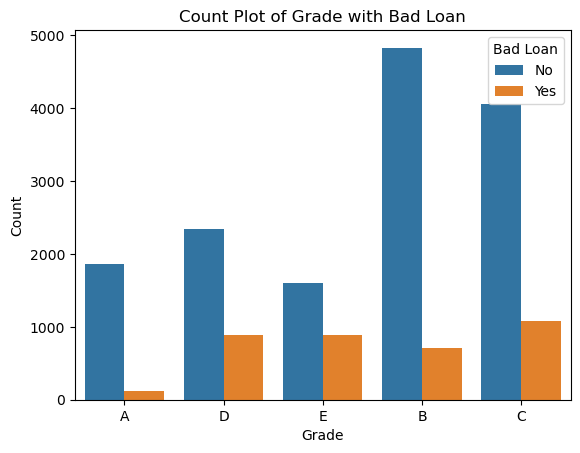

In [27]:
sns.countplot(data=cat_col, x="grade", hue="bad_loan")
plt.xlabel("Grade")
plt.ylabel("Count")
plt.title("Count Plot of Grade with Bad Loan")
plt.legend(title="Bad Loan", labels=["No", "Yes"])
plt.show()

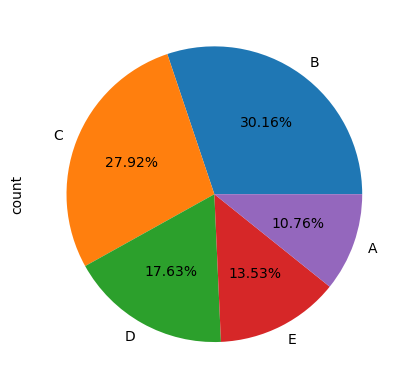

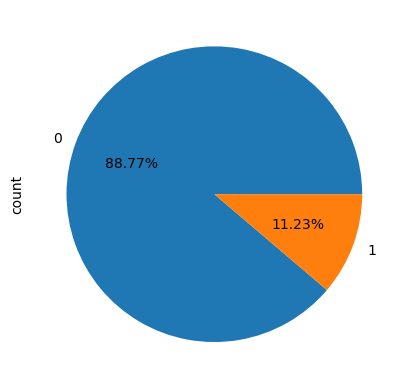

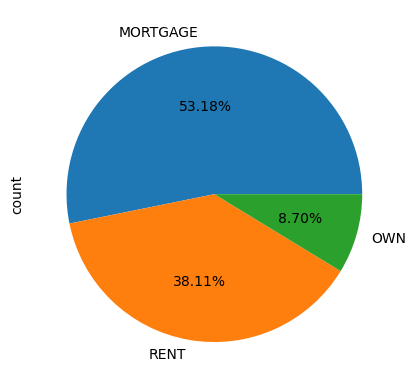

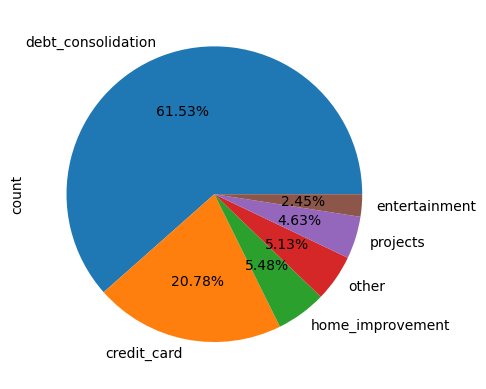

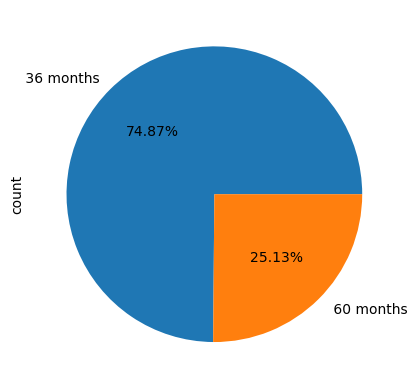

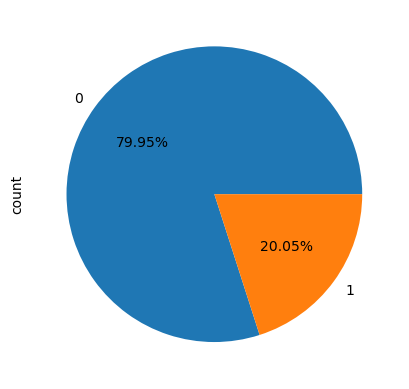

In [28]:
for feature in cat_col:
    cat_col[feature].value_counts().plot(kind = 'pie', autopct = '%0.2f%%')
    plt.show()

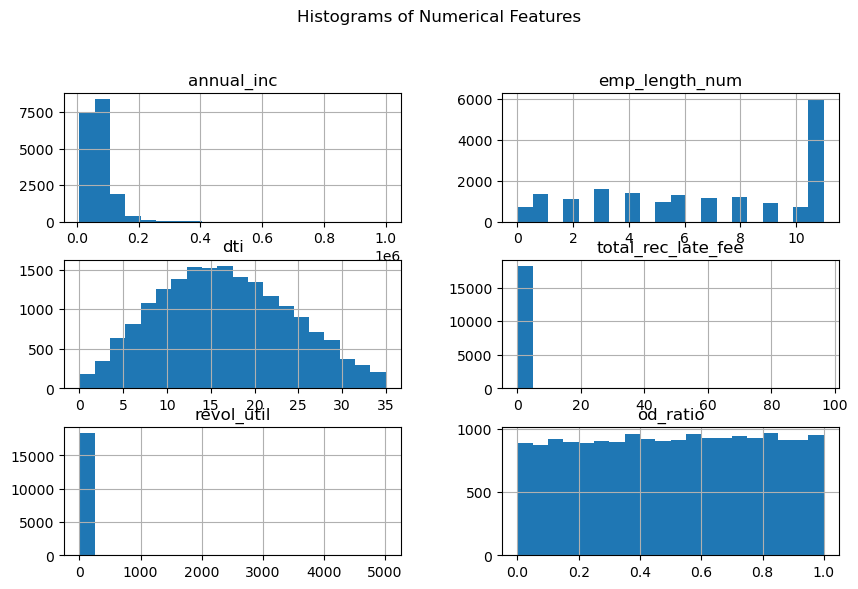

In [29]:
# Histograms for numerical columns.
num_col.hist(bins=20, figsize=(10, 6))
plt.suptitle("Histograms of Numerical Features",y=1.02)
plt.show()

# data preprocessing

In [30]:
# One hot Endocing for "home_ownership" and "purpose".
bank_data = pd.get_dummies(bank_data, columns=['home_ownership', 'purpose', 'grade'])
bank_data.head()


,annual_inc,short_emp,emp_length_num,dti,term,last_delinq_none,revol_util,total_rec_late_fee,od_ratio,bad_loan,home_ownership_MORTGAGE,home_ownership_OWN,home_ownership_RENT,purpose_credit_card,purpose_debt_consolidation,purpose_entertainment,purpose_home_improvement,purpose_other,purpose_projects,grade_A,grade_B,grade_C,grade_D,grade_E
0,100000.0,1,1,26.27,36 months,1,43.2,0.0,0.160624,0,False,False,True,True,False,False,False,False,False,True,False,False,False,False
1,83000.0,0,4,5.39,36 months,0,21.5,0.0,0.810777,0,False,True,False,True,False,False,False,False,False,True,False,False,False,False
2,78000.0,0,11,18.45,60 months,1,46.3,0.0,0.035147,1,True,False,False,False,True,False,False,False,False,False,False,False,True,False
3,37536.0,0,6,12.28,60 months,0,10.7,0.0,0.534887,1,True,False,False,False,False,False,False,False,True,False,False,False,True,False
4,65000.0,0,11,11.26,36 months,0,15.2,0.0,0.166500,0,True,False,False,False,True,False,False,False,False,False,False,False,True,False


In [31]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
# Create a LabelEncoder object
label_encoder = LabelEncoder()
bank_data["term"] = label_encoder.fit_transform(bank_data["term"])


In [32]:
scaler = StandardScaler()
scaler.fit(num_col)
num_col = scaler.transform(num_col)


In [33]:
# seperaring dependent and independent colmns
X = bank_data.drop("bad_loan", axis=1)
y = bank_data["bad_loan"]

In [34]:
# print(X)

In [35]:
# print(y)

In [36]:
# List of columns to replace values in
columns_to_replace = ['home_ownership_MORTGAGE', 'home_ownership_OWN', 'home_ownership_RENT', 
                      'purpose_credit_card', 'purpose_debt_consolidation', 'purpose_entertainment', 
                      'purpose_home_improvement', 'purpose_other', 'purpose_projects', 'grade_A', 
                      'grade_B', 'grade_C', 'grade_D', 'grade_E']

# Replace False with 0 and True with 1 in specific columns
bank_data[columns_to_replace] = bank_data[columns_to_replace].replace({False: 0, True: 1})
print(bank_data.head())


   annual_inc  short_emp  emp_length_num    dti  term  last_delinq_none  \
0    100000.0          1               1  26.27     0                 1   
1     83000.0          0               4   5.39     0                 0   
2     78000.0          0              11  18.45     1                 1   
3     37536.0          0               6  12.28     1                 0   
4     65000.0          0              11  11.26     0                 0   

   revol_util  total_rec_late_fee  od_ratio  bad_loan  \
0        43.2                 0.0  0.160624         0   
1        21.5                 0.0  0.810777         0   
2        46.3                 0.0  0.035147         1   
3        10.7                 0.0  0.534887         1   
4        15.2                 0.0  0.166500         0   

   home_ownership_MORTGAGE  home_ownership_OWN  home_ownership_RENT  \
0                        0                   0                    1   
1                        0                   1                  

In [37]:
bank_data = pd.DataFrame(bank_data)

# Replace False with 0 and True with 1 using a for loop
for col in bank_data.columns:
    if bank_data[col].dtype == bool:
        bank_data[col] = bank_data[col].astype(int)

# print(bank_data)

# model building

In [38]:
# train_test_spit
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=47)

In [39]:
from sklearn.tree import DecisionTreeClassifier
dtree=DecisionTreeClassifier(criterion='entropy')
dtree.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [40]:
y_pred=dtree.predict(X_test)

In [41]:
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [42]:
## Training Accuracy:
from sklearn.metrics import confusion_matrix,classification_report,\
accuracy_score

In [43]:
y_pred_train=dtree.predict(X_train)
print('Training Accuracy :',accuracy_score(y_train,y_pred_train))

Training Accuracy : 1.0


In [44]:
#testing accuracy
y_pred_test=dtree.predict(X_test)
print('Testing Accuracy :',accuracy_score(y_test,y_pred_test))

Testing Accuracy : 0.710204081632653


In [45]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(X_train,y_train)

LogisticRegression()

In [46]:
y_pred = lr.predict(X_test)

In [47]:
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [48]:
from sklearn.metrics import accuracy_score
accuracy_score(y_train,lr.predict(X_train))

0.7978361458900382

In [49]:
confusion_matrix(y_test,y_pred)

array([[2963,    0],
       [ 712,    0]], dtype=int64)

In [50]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.81      1.00      0.89      2963
           1       0.00      0.00      0.00       712

    accuracy                           0.81      3675
   macro avg       0.40      0.50      0.45      3675
weighted avg       0.65      0.81      0.72      3675



In [51]:
from sklearn.ensemble import RandomForestClassifier

In [52]:
rf = RandomForestClassifier()
rf.fit(X_train,y_train)
y_pred = rf.predict(X_test)

In [53]:
accuracy_score(y_train,rf.predict(X_train))

0.9998639085465433

In [54]:
accuracy_score(y_test,rf.predict(X_test))

0.806530612244898